In [1]:
import copy, json, random, time, torch, torchvision
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.patches as patches

import torch.nn.functional as F
from torch.utils.data import DataLoader
from torch import nn
from collections import defaultdict

from utilities import scale_bbox, centerwh_to_x1y1wh, x1y1wh_to_centerwh, chw_to_hwc

device = "cuda"
torch.cuda.set_per_process_memory_fraction(1., 0)

In [2]:
torch.cuda.empty_cache() 

# Load Pascal 2012 Data

In [3]:
cats = {
 -1: 'background',
 0: 'pottedplant',
 1: 'boat',
 2: 'bicycle',
 3: 'cat',
 4: 'chair',
 5: 'person',
 6: 'diningtable',
 7: 'car',
 8: 'motorbike',
 9: 'horse',
 10: 'bus',
 11: 'train',
 12: 'bottle',
 13: 'sofa',
 14: 'cow',
 15: 'bird',
 16: 'sheep',
 17: 'aeroplane',
 18: 'dog',
 19: 'tvmonitor'
}

reversed_cats = dict(zip(cats.values(),cats.keys()))

In [4]:
import torchvision.transforms.functional as transforms

HEIGHT, WIDTH = 224, 224

def custom_test_tranforms(img, target):
    '''
    Applies transformations to the image and the target resprectively.
    '''
    new_img = transforms.to_tensor(img)
    new_target = target
    objects = target['annotation']['object']
    new_target = []
    for obj in objects:
        voc_bb = obj['bndbox']
        bb = [int(voc_bb['xmin']),
                int(voc_bb['ymin']),
                int(voc_bb['xmax'])-int(voc_bb['xmin']), 
                int(voc_bb['ymax'])-int(voc_bb['ymin'])
               ]
        scaled_bb = scale_bbox(new_img, bb, HEIGHT, WIDTH) #scale and normalize
        new_entry = x1y1wh_to_centerwh(scaled_bb, single_img=True)
        
        new_entry.append(reversed_cats[obj['name']])
        new_target.append(new_entry)
    new_img = transforms.resize(new_img, (HEIGHT, WIDTH))
    new_img = transforms.normalize(new_img, (0.485, 0.456, 0.406), (0.229, 0.224, 0.225))
    return new_img, new_target

def custom_train_tranforms(img, target):
    '''
    Applies transformations to the image and the target resprectively.
    '''
    new_img = transforms.to_tensor(img)
    new_target = target
    objects = target['annotation']['object']
    new_target = []
    for obj in objects:
        voc_bb = obj['bndbox']
        bb = [int(voc_bb['xmin']),
                int(voc_bb['ymin']),
                int(voc_bb['xmax'])-int(voc_bb['xmin']), 
                int(voc_bb['ymax'])-int(voc_bb['ymin'])
               ]
        scaled_bb = scale_bbox(new_img, bb, HEIGHT, WIDTH) #scale and normalize
        new_entry = x1y1wh_to_centerwh(scaled_bb, single_img=True)
        
        new_entry.append(reversed_cats[obj['name']])
        new_target.append(new_entry)
    new_img = transforms.resize(new_img, (HEIGHT, WIDTH))
    
    jit = torchvision.transforms.ColorJitter(brightness=.1, contrast=.1, saturation=.1, hue=.1)
    new_img = jit(new_img)
    if random.random() < 0.5:
        new_img, new_target = horizontal_flip(new_img, new_target)
    
    new_img = transforms.normalize(new_img, (0.485, 0.456, 0.406), (0.229, 0.224, 0.225))
    return new_img, new_target

def horizontal_flip(images, targets):
    images = torch.flip(images, [-1])
    targets = torch.Tensor(targets)
    targets[:, 0] = 1 - targets[:, 0]
    return images, targets.tolist()

def collate_fn(batch):
    '''
    Custom collection function that transforms a list of tuples (img, target) 
    into a tuple of lists/tensors (imgs, bb, class)
    '''
    x = [b[0] for b in batch]
    x = torch.stack(x, dim=0)
    gt = [torch.Tensor([obj[:4] for obj in b[1]]) for b in batch]

    c = [torch.Tensor([obj[4] for obj in b[1]]) for b in batch]
    return (x, gt, c)

def denormalize(img):
    img = transforms.normalize(img, (-0.485/0.229, -0.456/0.224, -0.406/0.225), (1/0.229, 1/0.224, 1/0.225))
    return img


In [5]:
PATH = '/home/flo/data/'
train_data = torchvision.datasets.VOCDetection(PATH, transforms=custom_train_tranforms, download=True, image_set='train')
val_data = torchvision.datasets.VOCDetection(PATH, transforms=custom_test_tranforms, image_set='val')

train_loader = DataLoader(train_data, batch_size=128, shuffle=True, collate_fn=collate_fn, drop_last=True)
val_loader = DataLoader(val_data, batch_size=128, shuffle=True, collate_fn=collate_fn, drop_last=True)

Using downloaded and verified file: /home/flo/data/VOCtrainval_11-May-2012.tar
Extracting /home/flo/data/VOCtrainval_11-May-2012.tar to /home/flo/data/


# Visualize Data

In [6]:
batch = next(iter(train_loader))

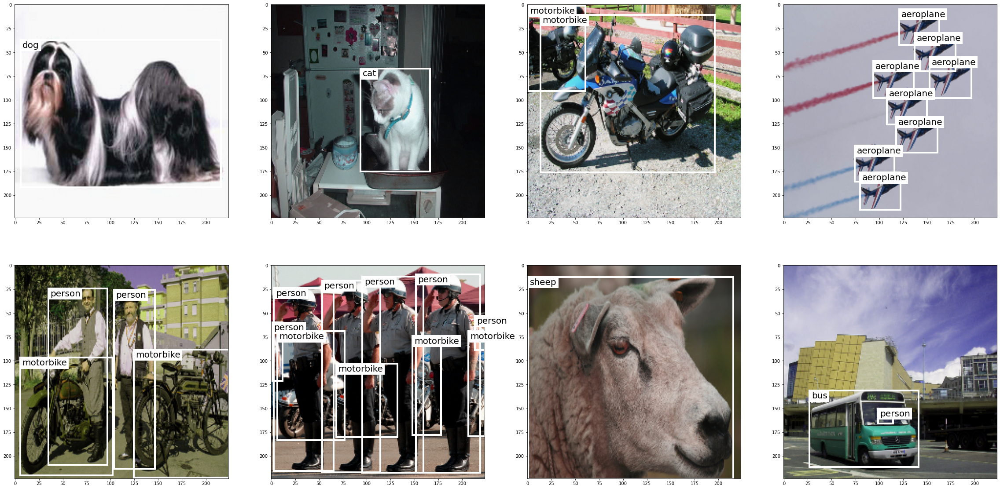

In [7]:
batch = next(iter(train_loader))
fig, axes = plt.subplots(nrows=2, ncols=4, figsize=(40,20))
axes = axes.flatten()
for i in range(len(batch[0]))[:8]:
        
    img, bbs, classes = batch[0][i], centerwh_to_x1y1wh(batch[1][i]), batch[2][i]
    axes[i].imshow(chw_to_hwc(denormalize(img.squeeze())))
    for bb, cls in zip(bbs,classes):
        bb = bb*224
        rect = patches.Rectangle(bb[:2], bb[2],bb[3], linewidth=4, edgecolor='white', facecolor='none')
        axes[i].add_patch(rect)
        cat = axes[i].text(bb[0]+2, bb[1]+8, cats[int(cls)], c='black', size=20, bbox=dict(facecolor='white', edgecolor='none'))
plt.show()


# Model Definition

### Anchor Boxes

In [8]:
anchor_grid = [7, 4, 2, 1] # corresponds to the output of output conv layers (7x7, ..., 1x1)
anchor_zooms = [0.7, 1.0, 1.3] # zoom levels for boxes defined by grid
anchor_ratios = [(1.0, 1.0), (1.0, 0.5), (0.5, 1.0)] # ratios for boxes defined by grid

anchor_scales = [(anc*h, anc*w) for anc in anchor_zooms for (h,w) in anchor_ratios]
anchor_offsets = [1/(2*o) for o in anchor_grid]
k = len(anchor_scales) # number of boxes per box given by grid

# anchor center x-values
anchor_x = [np.repeat(np.linspace(ao, 1-ao, ag), ag) for (ao, ag) in zip(anchor_offsets, anchor_grid)]
anchor_x = np.concatenate(anchor_x)

# anchor center y-values
anchor_y = [np.tile(np.linspace(ao, 1-ao, ag), ag) for ao,ag in zip(anchor_offsets, anchor_grid)]
anchor_y = np.concatenate(anchor_y)

anchor_centers = np.repeat(np.stack([anchor_x, anchor_y], axis=1), k, axis=0)

#calulate anchors widhts and heights
anchor_sizes  = [np.array([[w/ag, h/ag] for _ in range(ag**2) for w, h in anchor_scales])
                 for ag in anchor_grid]
anchor_sizes = np.concatenate(anchor_sizes)

anchors = np.concatenate([anchor_centers, anchor_sizes], axis=1)
anchors = torch.from_numpy(anchors).float()
anchors = anchors.to(device)

### Model Architecture

In [9]:
n_cats = len(cats)

def flatten_conv(x,k=9):
    '''Flatten prediction to format --> batchsize, bbox, prediction'''
    bs,nr_filter,w,h = x.size()
    x = x.permute(0,2,3,1).contiguous()
    return x.view(bs,-1,nr_filter//k)

from torch import nn
class SSD_Tail(torch.nn.Module):
    def __init__(self, k, p=[.2,.5]):
        super().__init__()
        self.k = k
        self.p = p
        print(self.p)
        self.do0 = nn.Dropout(self.p[0])
        self.conv1 = nn.Conv2d(512, 256, stride=1, kernel_size=3, padding=1, bias=False)
        self.bn1 = nn.BatchNorm2d(256)
        self.do1 = nn.Dropout(self.p[1])
        
        self.conv2 = nn.Conv2d(256, 256, stride=1, kernel_size=3, padding=1, bias=False) #7x7
        self.bn2 = nn.BatchNorm2d(256)
        self.do2 = nn.Dropout(self.p[1])
        
        self.conv3 = nn.Conv2d(256, 256, stride=2, kernel_size=3, padding=1, bias=False) #4x4
        self.bn3 = nn.BatchNorm2d(256)
        self.do3 = nn.Dropout(self.p[1])
        
        self.conv4 = nn.Conv2d(256, 256, stride=2, kernel_size=3, padding=1, bias=False) #2x2
        self.bn4 = nn.BatchNorm2d(256)
        self.do4 = nn.Dropout(self.p[1])
        
        self.conv5 = nn.Conv2d(256, 256, stride=2, kernel_size=3, padding=1, bias=False) #1x1
        self.bn5 = nn.BatchNorm2d(256)
        self.do5 = nn.Dropout(self.p[1])
        
        #Out Convs
        self.oconv1 = nn.Conv2d(256, (n_cats)*self.k, stride = 1, kernel_size = 3, padding=1)
        self.oconv2 = nn.Conv2d(256, 4*self.k, stride = 1, kernel_size = 3,padding=1)
        
        self.oconv3 = nn.Conv2d(256, (n_cats)*self.k, stride = 1, kernel_size = 3, padding=1)
        self.oconv4 = nn.Conv2d(256, 4*self.k, stride = 1, kernel_size = 3,padding=1)
        
        self.oconv5 = nn.Conv2d(256, (n_cats)*self.k, stride = 1, kernel_size = 3, padding=1)
        self.oconv6 = nn.Conv2d(256, 4*self.k, stride = 1, kernel_size = 3,padding=1)
        
        self.oconv7 = nn.Conv2d(256, (n_cats)*self.k, stride = 1, kernel_size = 3, padding=1)
        self.oconv8 = nn.Conv2d(256, 4*self.k, stride = 1, kernel_size = 3,padding=1)
    def forward(self, inputs):
        x = self.do0(inputs)
        x = self.conv1(x)
        x = self.bn1(x)
        x = nn.functional.relu(x)
        x = self.do1(x)
        
        x = self.conv2(x)
        x = self.bn2(x)
        x = nn.functional.relu(x)
        x = self.do2(x)
        o1 = flatten_conv(self.oconv1(x), self.k),flatten_conv(self.oconv2(x), self.k)
        
        x = self.conv3(x)
        x = self.bn3(x)
        x = nn.functional.relu(x)
        x = self.do3(x)
        o2 = flatten_conv(self.oconv3(x), self.k),flatten_conv(self.oconv4(x), self.k)
        
        x = self.conv4(x)
        x = self.bn4(x)
        x = nn.functional.relu(x)
        x = self.do4(x)
        
        o3 = flatten_conv(self.oconv5(x), self.k),flatten_conv(self.oconv6(x), self.k)
        x = self.conv5(x)
        x = self.bn5(x)
        x = nn.functional.relu(x)
        x = self.do5(x)
        o4 = flatten_conv(self.oconv7(x), self.k),flatten_conv(self.oconv8(x), self.k)

        return torch.cat((o1[0], o2[0], o3[0], o4[0]), dim=1), torch.cat((o1[1], o2[1], o3[1], o4[1]), dim=1)
    
    
    
class SSD_model(nn.Module):
    def __init__(self, k, p=[.2,.5]):
        super().__init__()
        self.backbone = torch.nn.Sequential(*list(torchvision.models.resnet34(pretrained=True).children())[:-2])
        self.SSD_tail = SSD_Tail(k, p)
        self.bb_is_trainable = True
        
    def forward(self, inputs):
        x = self.backbone(inputs)
        return(self.SSD_tail(x))
    
    def freeze_backbone(self, freeze=True):
        
        for param in self.backbone.parameters():
            param.requires_grad = freeze
        self.bb_is_trainable = freeze
        return freeze
        

# Training Procedure

### IoU - Intersection over Union

In [10]:
def center_to_x1y1x2y2(bb) -> float:
    """
    Convert from (cx, cy, w, h) to (x1, y1, x2, xy) where (x1, y1) is the top left corner and 
    (x2, y2) the right down corner
    """
    xmin = bb[:, 0] - 0.5 * bb[:, 2]
    xmax = bb[:, 0] + 0.5 * bb[:, 2]

    ymin = bb[:, 1] - 0.5 * bb[:, 3]
    ymax = bb[:, 1] + 0.5 * bb[:, 3]
    return torch.stack([xmin, ymin, xmax, ymax], dim=1)


def intersection(bb_a: torch.Tensor, bb_b: torch.Tensor) -> float:
    temp_bb_a = center_to_x1y1x2y2(bb_a)
    temp_bb_b = center_to_x1y1x2y2(bb_b)
    
    bb_a_x1 = temp_bb_a[:, 0]
    bb_a_y1 = temp_bb_a[:, 1]
    bb_a_x2 = temp_bb_a[:, 2]
    bb_a_y2 = temp_bb_a[:, 3]
    
    bb_b_x1 = temp_bb_b[ :, 0]
    bb_b_y1 = temp_bb_b[ :, 1]
    bb_b_x2 = temp_bb_b[ :, 2]
    bb_b_y2 = temp_bb_b[ :, 3]
    
    x1 = torch.max(bb_a_x1[:, None], bb_b_x1[None, :])
    y1 = torch.max(bb_a_y1[:, None], bb_b_y1[None, :])
    
    x2 = torch.min(bb_a_x2[:, None], bb_b_x2[None, :])
    y2 = torch.min(bb_a_y2[:, None], bb_b_y2[None, :])
    
    xy_1 = torch.stack((x1,y1), dim=2)
    xy_2 = torch.stack((x2,y2), dim=2)
    inter_own = torch.clamp(xy_2-xy_1, min=0)
    return inter_own[:, :, 0] * inter_own[:, :, 1]
   

def bb_area(bb: torch.Tensor) -> float:
    return bb[:, 2] * bb[:, 3]


def iou(bb_a, bb_b):
    '''
    Calculates the iou (Intersection over Union)/Jaccard Index of two bounding boxes
    '''
    inter = intersection(bb_a, bb_b)
    union = bb_area(bb_a).unsqueeze(1) + bb_area(bb_b).unsqueeze(0) - inter
    return inter / union
    

In [11]:
def loc_transformation(g, d, overlap_idx):
    '''
    According to the Loss Function from the SSD Paper, Equation #2
    g: ground truth box
    d: default (anchor) box
    '''

    g_cx, g_cy, g_w, g_h = g[:,0], g[:,1], g[:,2], g[:,3]
    d_cx, d_cy, d_w, d_h = d[:,0], d[:,1], d[:,2], d[:,3]
        
    return torch.cat([g_cx - d_cx[overlap_idx] / d_w[overlap_idx],
                      (g_cy - d_cy[overlap_idx]) / d_h[overlap_idx],
                      torch.log((g_w / d_w[overlap_idx])),
                      torch.log((g_h / d_h[overlap_idx]))
                     ], dim=1)

In [12]:
def invert_transformation(bb_hat, anchors):
    """
    Invert the transform from "loc_transformation".
    """

    return torch.stack([anchors[:, 0] + bb_hat[:, 0] * anchors[:, 2],
                        anchors[:, 1] + bb_hat[:, 1] * anchors[:, 3],
                        anchors[:, 2] * torch.exp(bb_hat[:, 2]),
                        anchors[:, 3] * torch.exp(bb_hat[:, 3])
                        ], dim=1)

class FocalLoss(nn.Module):
    def __init__(self, alpha=0.25, gamma=2, eps=1e-10):
        super().__init__()
        self.alpha = alpha
        self.gamma = gamma
        self.eps = eps

    def forward(self, preds, target):
        p = torch.sigmoid(preds)
        pt = p * target.float() + (1.0 - p) * (1 - target).float()
        alpha_t = (1.0 - self.alpha) * target.float() + self.alpha * (1 - target).float()
        loss = - 1.0 * torch.pow((1 - pt), self.gamma) * torch.log(pt + self.eps)
        return loss.sum()

def find_overlap(bbox_true, anchors, jaccard_overlap):
    bbox_true = bbox_true.to(device)
    jaccard_tensor = iou(anchors, bbox_true)
    _, max_overlap = torch.max(jaccard_tensor, dim=0)
    #print('jaccard_tensor', jaccard_tensor.shape)
    overlap_list = []   
    for i in range(len(bbox_true)):

        threshold_overlap = (jaccard_tensor[:, i] > jaccard_overlap).nonzero()
        if len(threshold_overlap) > 0:
            threshold_overlap = threshold_overlap[:, 0]
            overlap = torch.cat([max_overlap[i].view(1), threshold_overlap])
            overlap = torch.unique(overlap)     
        else:
            overlap = max_overlap[i].view(1)
        overlap_list.append(overlap)
    return overlap_list

def one_hot_encoding(labels, num_classes):
    return torch.eye(num_classes)[labels]
    

def loc_transformation(x, anchors, overlap_indicies):
        # Doing location transformations according to SSD paper
        return torch.cat([(x[:, 0:1] - anchors[overlap_indicies, 0:1]) / anchors[overlap_indicies, 2:3],
                          (x[:, 1:2] - anchors[overlap_indicies, 1:2]) / anchors[overlap_indicies, 3:4],
                          torch.log((x[:, 2:3] / anchors[overlap_indicies, 2:3])),
                          torch.log((x[:, 3:4] / anchors[overlap_indicies, 3:4]))
                         ], dim=1)


class SSD_loss(nn.Module):
    
    def __init__(self, overlap_factor=.6, loc_loss_weight_factor=10):
        super().__init__()
        self.focal_loss = FocalLoss()
        self.overlap_factor = overlap_factor
        self.loc_loss_weight_factor = loc_loss_weight_factor
    
    def forward(self, outputs, targets):
        loc_loss = 0.0
        class_loss = 0.0
        for i in range(len(outputs[0])): # images from batch
            class_pred, loc_pred = outputs[0][i].to(device), outputs[1][i].to(device)
            class_gt, loc_gt = targets[1][i].to(device), targets[0][i].to(device)
            overlaps = find_overlap(loc_gt, anchors, self.overlap_factor)
            
            class_target = torch.zeros(class_pred.shape[0]).float().to(device)
            temp_loc_loss = .0
            for j in range(len(overlaps)):  # bbs in image
                overlap = overlaps[j]
                class_target[overlap] = class_gt[j]
                #print('overlap_list',len(overlaps))
                input_ = loc_pred[overlap, :]
                target_ = loc_transformation(loc_gt[j, :].expand((len(overlap), 4)), anchors, overlap)
                
                temp_loc_loss += F.smooth_l1_loss(input=input_, target=target_, reduction="sum") / len(overlap)
            loc_loss += temp_loc_loss / loc_gt.shape[0] # location loss per ground truth object
            
            class_target = one_hot_encoding(class_target.long(), len(cats)).float().to(device)
            class_loss += self.focal_loss(class_pred, class_target) / loc_gt.shape[0] # classification loss per ground truth object
            
            #if i == 0: print(class_loss)
        loc_loss = loc_loss/len(outputs[0])
        class_loss = class_loss/len(outputs[0])
        loss = class_loss + loc_loss * self.loc_loss_weight_factor

        return loss, loc_loss, class_loss
    
    

    


In [13]:
from tqdm.notebook import tqdm, trange

batch = next(iter(train_loader))
EPOCHS = 1

def train(model, train_loader, val_loader, loss_fn=SSD_loss, save_name='temp', epochs=1, lr=1e-3, wd=1e-2):
    stats = pd.DataFrame(columns=[
        'epoch', 
        'train total loss', 
        'train localization loss', 
        'train classification loss',
        'val mAP',
        'val total loss', 
        'val localization loss', 
        'val classification loss'
    ])
    optim = torch.optim.Adam(model.parameters(), lr=lr, weight_decay=wd)
    batch = next(iter(val_loader))
    map_metric = MAP(model, batch)
    SSD_loss = loss_fn()
    best_map_score = 0
    best_val_loss = 100
    stats_save_path = './stats/'+save_name+time.strftime('%d-%m-%Y-%H:%M' ,time.localtime())+'.pkl'
    for e in range(epochs):
        t0 = time.time()
        epochlosses = [.0, .0, .0]
        #for i, batch in enumerate(tqdm(train_loader)):
        model.train()
        for i, batch in enumerate(train_loader):
            
            imgs, bbs, classes = batch
            imgs = imgs.to(device)
            preds = model(imgs) # torch.Size([2, 16, 21])
            losses = SSD_loss(preds, (bbs, classes));
            #def forward(self, class_hat, bb_hat, class_true, bb_true):
            '''print('Batch #:', i,
                  ' \n total Batchloss: ', loss.item(),
                  ' \n Localization Batchloss: ', loc_loss.item(),
                  ' \n Classification Batchloss: ', class_loss.item()
                 )'''
            optim.zero_grad()
            losses[0].backward()
            optim.step()
            epochlosses[0] += losses[0]
            epochlosses[1] += losses[1]
            epochlosses[2] += losses[2]
        vallosses = [.0, .0, .0]
        #for i, batch in enumerate(tqdm(val_loader)):
        model.eval()
        for i, batch in enumerate(val_loader):
            
            
            with torch.no_grad():
                imgs, bbs, classes = batch
                imgs = imgs.to(device)
                preds = model(imgs) # torch.Size([2, 16, 21])
                losses = SSD_loss(preds, (bbs, classes));
                
                vallosses[0] += losses[0]
                vallosses[1] += losses[1]
                vallosses[2] += losses[2]
            
        t1 = time.time()
        map_score = map_metric()[1]
        stats.loc[e] = [
            e,
            epochlosses[0].item()/len(train_loader),
            epochlosses[1].item()/len(train_loader),
            epochlosses[2].item()/len(train_loader),
            map_score,
            vallosses[0].item()/len(val_loader),
            vallosses[1].item()/len(val_loader),
            vallosses[2].item()/len(val_loader),
        ]
        if bool(save_name) and map_score>best_map_score:
            best_map_score = map_score
            print('saved model because new best map score at epoch:', e)
            torch.save(model.state_dict(), './models/-best_map-'+save_name+'.pth')
        if bool(save_name) and vallosses[0].item()/len(val_loader)<best_val_loss:
            best_val_loss = vallosses[0].item()/len(val_loader)
            print('saved model because new lowest loss at epoch:', e)
            torch.save(model.state_dict(), './models/-best_loss-'+save_name+'.pth')
        
            
        print('Epoch #:', e,
                  ' \n ----- Training -----',
                  ' \n total Epochloss: ', epochlosses[0].item()/len(train_loader),
                  ' \n Localization Epochloss: ', epochlosses[1].item()/len(train_loader),
                  ' \n Classification Epochloss: ', epochlosses[2].item()/len(train_loader),
                  ' \n ----- Validation -----',
                  ' \n mAP: ', map_score,
                  ' \n total Epochloss: ', vallosses[0].item()/len(val_loader),
                  ' \n Localization Epochloss: ', vallosses[1].item()/len(val_loader),
                  ' \n Classification Epochloss: ', vallosses[2].item()/len(val_loader),
                  ' \n Duration in S: ', int(t1-t0),
            )
        
        stats.to_pickle(stats_save_path)
    return stats

In [14]:
class MAP:
    def __init__(self, model, dataset, jaccard_threshold = 0.5, anchors=anchors):
        self.jaccard_threshold = jaccard_threshold
        self.model = model
        self.eps = np.finfo(np.float32).eps
        self.anchors = anchors
        self.dataset = dataset

    @staticmethod
    def voc_ap(rec, prec):
        """Compute VOC AP given precision and recall with the VOC-07 11-point method."""

        ap = 0.0
        for t in np.arange(0.0, 1.1, 0.1):
            if np.sum(rec >= t) == 0:
                p = 0.0
            else:
                p = np.max(prec[rec >= t])
            ap = ap + p / 11.0
        #print(ap)
        return ap

    def __call__(self):
        self.model.eval()
        aps = defaultdict(list)

        for k in range(len(self.dataset[0])):
            x, bb_true, class_true = self.dataset[0][k].to(device), self.dataset[1][k].to(device), self.dataset[2][k].to(device)
            class_true = class_true - 1 # -1 to convert it from 1-21 to 0-20
            x = x[None, :, :, :]
            class_hat, bb_hat = self.model(x)
            class_hat = class_hat[0, :, 1:].sigmoid()
            bb_hat = invert_transformation(bb_hat.squeeze(0), self.anchors)
            jacard_values = iou(bb_hat.squeeze(0), bb_true)
            for j in range(len(class_true)):
                overlap = (jacard_values[:, j] > self.jaccard_threshold).nonzero()
                class_true_j = int(class_true[j].detach().cpu().numpy())
                #print(class_true_j)
                if len(overlap) > 0:
                    class_hat_j = class_hat[overlap[:,0], :]
                    prob, class_id = class_hat_j.max(1)
                    prob, sort_index = torch.sort(prob, descending=True)
                    class_id = class_id[sort_index].detach().cpu().numpy()
                    tp = np.zeros_like(class_id)
                    fp = np.zeros_like(class_id)
                    found = False
                    for d in range(len(class_id)):
                        if found or class_id[d] != class_true[j]:
                            fp[d] = 1.0
                        else:
                            tp[d] = 1.0
                            found = True

                    fp = np.cumsum(fp)
                    tp = np.cumsum(tp)

                    rec = tp
                    prec = tp / np.maximum(tp + fp, self.eps)

                    temp_ap = MAP.voc_ap(rec, prec)
                    aps[class_true_j].append(temp_ap)
                else:
                    aps[class_true_j].append(0)

        res_list = []
        for _, list_value in aps.items():
            res_list.append(sum(list_value) / len(list_value))

        return res_list, sum(res_list) / len(res_list)

In [15]:
class MAP1:
    def __init__(self, model, dataloader, jaccard_threshold = 0.5, anchors=anchors):
        self.jaccard_threshold = jaccard_threshold
        self.model = model
        self.eps = np.finfo(np.float32).eps
        self.anchors = anchors
        self.dataloader = dataloader

    @staticmethod
    def voc_ap(rec, prec):
        """Compute VOC AP given precision and recall with the VOC-07 11-point method."""

        ap = 0.0
        for t in np.arange(0.0, 1.1, 0.1):
            if np.sum(rec >= t) == 0:
                p = 0.0
            else:
                p = np.max(prec[rec >= t])
            ap = ap + p / 11.0
        return ap

    def __call__(self):
        self.model.eval()
        aps = defaultdict(list)
        runs = 0

        for i, batch in enumerate(self.dataloader):
            x, bb_true, class_true = batch
            x = x.to(device)
            bb_true = bb_true
            class_hat, bb_hat = self.model(x)
            for k in range(len(x)):
                bb_hat_k = invert_transformation(bb_hat[k].squeeze(0), self.anchors)
                #print(k, class_hat.shape)
                class_hat_k = class_hat[k, :, 1:].sigmoid()
                class_true_k = class_true[k] #-1 #to convert it from 1-21 to 0-20
                jacard_values = iou(bb_hat_k.to(device), bb_true[k].to(device))

                for j in range(len(class_true[k])):
                    overlap = (jacard_values[:, j] > self.jaccard_threshold).nonzero()
                    class_true_j = int(class_true[k][j].detach().cpu().numpy()) - 1
                    if len(overlap) > 0:
                        class_hat_j = class_hat_k[overlap[:,0], :]
                        
                        prob, class_id = class_hat_j.max(1)
                        prob, sort_index = torch.sort(prob, descending=True)
                        class_id = class_id[sort_index].detach().cpu().numpy()
                        tp = np.zeros_like(class_id)
                        fp = np.zeros_like(class_id)

                        found = False
                        for d in range(len(class_id)):
                            if found or class_id[d] != class_true_j:
                                fp[d] = 1.0
                            else:
                                tp[d] = 1.0
                                found = True

                        fp = np.cumsum(fp)
                        tp = np.cumsum(tp)

                        rec = tp
                        prec = tp / np.maximum(tp + fp, self.eps)

                        temp_ap = self.voc_ap(rec, prec)
                        aps[class_true_j].append(temp_ap)
                    else:
                        aps[class_true_j].append(0)

        res_list = []
        for _, list_value in aps.items():
            res_list.append(sum(list_value) / len(list_value))

        return res_list, sum(res_list) / len(res_list)

# Train Models

We use several values for dropout and weight decay, to find the best model. As defined in the training loop save the model with the lowest loss and the one with the highest mAP Score

In [18]:
model=SSD_model(k, p=[0.,0.]).to(device)

model.freeze_backbone(True)
train(model, train_loader, val_loader, epochs=150, wd=1e-2, save_name='do-0-wd-1e2-150e')
#PATH = './models/do-10-20-wd-1e2-150e-gamma-2'
#torch.save(model.state_dict(), PATH)

[0.0, 0.0]


/opt/conda/lib/python3.7/site-packages/torch/nn/functional.py:718: UserWarning: Named tensors and all their associated APIs are an experimental feature and subject to change. Please do not use them for anything important until they are released as stable. (Triggered internally at  /opt/conda/conda-bld/pytorch_1623448265233/work/c10/core/TensorImpl.h:1156.)
  return torch.max_pool2d(input, kernel_size, stride, padding, dilation, ceil_mode)


saved model because new best map score at epoch: 0
saved model because new lowest loss at epoch: 0
Epoch #: 0  
 ----- Training -----  
 total Epochloss:  67.71302379261364  
 Localization Epochloss:  0.23035105791958896  
 Classification Epochloss:  65.4095292524858  
 ----- Validation -----  
 mAP:  0.09111441909539737  
 total Epochloss:  7.976858181423611  
 Localization Epochloss:  0.20712140401204426  
 Classification Epochloss:  5.905645751953125  
 Duration in S:  201
saved model because new lowest loss at epoch: 1
Epoch #: 1  
 ----- Training -----  
 total Epochloss:  6.738283330743963  
 Localization Epochloss:  0.177075364372947  
 Classification Epochloss:  4.967529990456321  
 ----- Validation -----  
 mAP:  0.0900163308913309  
 total Epochloss:  6.335011121961806  
 Localization Epochloss:  0.16875773535834418  
 Classification Epochloss:  4.647433471679688  
 Duration in S:  196
saved model because new best map score at epoch: 2
saved model because new lowest loss at e

Epoch #: 20  
 ----- Training -----  
 total Epochloss:  4.08966758034446  
 Localization Epochloss:  0.108821532943032  
 Classification Epochloss:  3.0014523592862217  
 ----- Validation -----  
 mAP:  0.23813471843586936  
 total Epochloss:  5.047736612955729  
 Localization Epochloss:  0.13653873867458768  
 Classification Epochloss:  3.6823496500651043  
 Duration in S:  192
Epoch #: 21  
 ----- Training -----  
 total Epochloss:  4.035770069469105  
 Localization Epochloss:  0.10399728471582587  
 Classification Epochloss:  2.995796897194602  
 ----- Validation -----  
 mAP:  0.20513802310221751  
 total Epochloss:  4.910014512803819  
 Localization Epochloss:  0.13942287233140732  
 Classification Epochloss:  3.5157850477430554  
 Duration in S:  193
Epoch #: 22  
 ----- Training -----  
 total Epochloss:  4.000482732599432  
 Localization Epochloss:  0.10403671047904274  
 Classification Epochloss:  2.960115606134588  
 ----- Validation -----  
 mAP:  0.21985169922669923  
 tot

Epoch #: 42  
 ----- Training -----  
 total Epochloss:  3.7295698686079546  
 Localization Epochloss:  0.09155044772408226  
 Classification Epochloss:  2.8140652396462182  
 ----- Validation -----  
 mAP:  0.19855564711020046  
 total Epochloss:  4.9331614176432295  
 Localization Epochloss:  0.1348711225721571  
 Classification Epochloss:  3.5844495985243054  
 Duration in S:  191
saved model because new lowest loss at epoch: 43
Epoch #: 43  
 ----- Training -----  
 total Epochloss:  3.760549718683416  
 Localization Epochloss:  0.09219012477181175  
 Classification Epochloss:  2.838648709383878  
 ----- Validation -----  
 mAP:  0.20575565727963432  
 total Epochloss:  4.8386420355902775  
 Localization Epochloss:  0.13553095923529732  
 Classification Epochloss:  3.483332316080729  
 Duration in S:  191
Epoch #: 44  
 ----- Training -----  
 total Epochloss:  3.7413767034357246  
 Localization Epochloss:  0.09223460067402232  
 Classification Epochloss:  2.8190304149280894  
 ---

Epoch #: 63  
 ----- Training -----  
 total Epochloss:  3.5687366832386362  
 Localization Epochloss:  0.08492705496874722  
 Classification Epochloss:  2.7194659493186255  
 ----- Validation -----  
 mAP:  0.22435876552404688  
 total Epochloss:  4.951266818576389  
 Localization Epochloss:  0.135842227935791  
 Classification Epochloss:  3.5928446451822915  
 Duration in S:  193
Epoch #: 64  
 ----- Training -----  
 total Epochloss:  3.47717944058505  
 Localization Epochloss:  0.08089432391253384  
 Classification Epochloss:  2.6682369925759057  
 ----- Validation -----  
 mAP:  0.24322312509173125  
 total Epochloss:  5.676334974500868  
 Localization Epochloss:  0.1430734740363227  
 Classification Epochloss:  4.245599704318576  
 Duration in S:  191
Epoch #: 65  
 ----- Training -----  
 total Epochloss:  3.457046855579723  
 Localization Epochloss:  0.07965624332427979  
 Classification Epochloss:  2.6604843139648438  
 ----- Validation -----  
 mAP:  0.17131242544397918  
 to

Epoch #: 85  
 ----- Training -----  
 total Epochloss:  3.317704287442294  
 Localization Epochloss:  0.07682679999958385  
 Classification Epochloss:  2.5494367426091973  
 ----- Validation -----  
 mAP:  0.2504056179327919  
 total Epochloss:  5.102731323242187  
 Localization Epochloss:  0.13912724388970268  
 Classification Epochloss:  3.7114593505859377  
 Duration in S:  126
Epoch #: 86  
 ----- Training -----  
 total Epochloss:  3.29804819280451  
 Localization Epochloss:  0.07639560374346646  
 Classification Epochloss:  2.5340922962535513  
 ----- Validation -----  
 mAP:  0.21456102703065624  
 total Epochloss:  5.331856621636285  
 Localization Epochloss:  0.1422458118862576  
 Classification Epochloss:  3.9093973795572916  
 Duration in S:  127
Epoch #: 87  
 ----- Training -----  
 total Epochloss:  3.2830883372913706  
 Localization Epochloss:  0.07627537575635043  
 Classification Epochloss:  2.5203351107510654  
 ----- Validation -----  
 mAP:  0.1924331142713496  
 t

Epoch #: 107  
 ----- Training -----  
 total Epochloss:  3.118620439009233  
 Localization Epochloss:  0.0717856992374767  
 Classification Epochloss:  2.4007641185413706  
 ----- Validation -----  
 mAP:  0.2249010208877308  
 total Epochloss:  4.92825690375434  
 Localization Epochloss:  0.1294560644361708  
 Classification Epochloss:  3.6336964925130206  
 Duration in S:  126
Epoch #: 108  
 ----- Training -----  
 total Epochloss:  3.115554462779652  
 Localization Epochloss:  0.0724313584241  
 Classification Epochloss:  2.3912412470037285  
 ----- Validation -----  
 mAP:  0.25322877469456756  
 total Epochloss:  4.896395534939236  
 Localization Epochloss:  0.1303188853793674  
 Classification Epochloss:  3.5932064480251737  
 Duration in S:  126
Epoch #: 109  
 ----- Training -----  
 total Epochloss:  3.1429391340775923  
 Localization Epochloss:  0.07397821816531094  
 Classification Epochloss:  2.403156107122248  
 ----- Validation -----  
 mAP:  0.20873526807601528  
 tota

Epoch #: 129  
 ----- Training -----  
 total Epochloss:  3.0087086070667612  
 Localization Epochloss:  0.0722580064426769  
 Classification Epochloss:  2.2861291711980645  
 ----- Validation -----  
 mAP:  0.2126443265897961  
 total Epochloss:  5.182400512695312  
 Localization Epochloss:  0.13664737277560765  
 Classification Epochloss:  3.815926784939236  
 Duration in S:  132
Epoch #: 130  
 ----- Training -----  
 total Epochloss:  2.9524837840687144  
 Localization Epochloss:  0.06769790432669899  
 Classification Epochloss:  2.2755041989413174  
 ----- Validation -----  
 mAP:  0.2163591399271673  
 total Epochloss:  5.1753424750434025  
 Localization Epochloss:  0.13100897471110026  
 Classification Epochloss:  3.865252685546875  
 Duration in S:  132
Epoch #: 131  
 ----- Training -----  
 total Epochloss:  2.9270286560058594  
 Localization Epochloss:  0.06699657440185547  
 Classification Epochloss:  2.257063085382635  
 ----- Validation -----  
 mAP:  0.2164083515850746  

,epoch,train total loss,train localization loss,train classification loss,val mAP,val total loss,val localization loss,val classification loss
0,0.0,67.713024,0.230351,65.409529,0.091114,7.976858,0.207121,5.905646
1,1.0,6.738283,0.177075,4.967530,0.090016,6.335011,0.168758,4.647433
2,2.0,5.937691,0.155171,4.385979,0.102154,5.899645,0.160368,4.295969
3,3.0,5.602858,0.147316,4.129697,0.135675,5.841868,0.157568,4.266191
4,4.0,5.410983,0.145302,3.957958,0.152559,5.620094,0.159095,4.029146
...,...,...,...,...,...,...,...,...
145,145.0,2.893264,0.065758,2.235682,0.191249,5.022285,0.122860,3.793687
146,146.0,2.873844,0.065679,2.217049,0.244640,4.917558,0.126090,3.656662
147,147.0,2.841493,0.065109,2.190401,0.233537,4.907673,0.123606,3.671618
148,148.0,2.851131,0.065245,2.198677,0.236777,4.960184,0.126561,3.694576


In [19]:
model=SSD_model(k, p=[0.,0.]).to(device)

model.freeze_backbone(True)
train(model, train_loader, val_loader, epochs=150, wd=0, save_name='do-0-wd-0-150e')
#PATH = './models/do-10-20-wd-1e2-150e-gamma-2'
#torch.save(model.state_dict(), PATH)

[0.0, 0.0]
saved model because new best map score at epoch: 0
saved model because new lowest loss at epoch: 0
Epoch #: 0  
 ----- Training -----  
 total Epochloss:  62.64673961292613  
 Localization Epochloss:  0.2313904112035578  
 Classification Epochloss:  60.33284135298295  
 ----- Validation -----  
 mAP:  0.042143091304184935  
 total Epochloss:  7.958178032769097  
 Localization Epochloss:  0.21449353959825304  
 Classification Epochloss:  5.813243272569444  
 Duration in S:  131
saved model because new best map score at epoch: 1
saved model because new lowest loss at epoch: 1
Epoch #: 1  
 ----- Training -----  
 total Epochloss:  6.571760697798296  
 Localization Epochloss:  0.16665137897838245  
 Classification Epochloss:  4.905247428200462  
 ----- Validation -----  
 mAP:  0.09214330565186193  
 total Epochloss:  6.089308675130209  
 Localization Epochloss:  0.15411926905314127  
 Classification Epochloss:  4.548116387261285  
 Duration in S:  132
saved model because new b

saved model because new best map score at epoch: 19
Epoch #: 19  
 ----- Training -----  
 total Epochloss:  3.11867974021218  
 Localization Epochloss:  0.0826162804256786  
 Classification Epochloss:  2.2925161881880327  
 ----- Validation -----  
 mAP:  0.23636413481432178  
 total Epochloss:  5.137558661566841  
 Localization Epochloss:  0.1509552107916938  
 Classification Epochloss:  3.6280066596137153  
 Duration in S:  132
saved model because new best map score at epoch: 20
Epoch #: 20  
 ----- Training -----  
 total Epochloss:  3.05740668556907  
 Localization Epochloss:  0.08065611665899103  
 Classification Epochloss:  2.250844435258345  
 ----- Validation -----  
 mAP:  0.27522768879020804  
 total Epochloss:  4.911271158854166  
 Localization Epochloss:  0.14737189610799153  
 Classification Epochloss:  3.4375518798828124  
 Duration in S:  132
Epoch #: 21  
 ----- Training -----  
 total Epochloss:  2.9685984524813565  
 Localization Epochloss:  0.08030710437081078  
 Cl

Epoch #: 40  
 ----- Training -----  
 total Epochloss:  1.872096841985529  
 Localization Epochloss:  0.05587506294250488  
 Classification Epochloss:  1.3133465160023083  
 ----- Validation -----  
 mAP:  0.2677869208770075  
 total Epochloss:  5.5451331244574655  
 Localization Epochloss:  0.15840905507405598  
 Classification Epochloss:  3.961043294270833  
 Duration in S:  132
Epoch #: 41  
 ----- Training -----  
 total Epochloss:  1.819153525612571  
 Localization Epochloss:  0.05493482676419345  
 Classification Epochloss:  1.2698053880171343  
 ----- Validation -----  
 mAP:  0.278698460548771  
 total Epochloss:  5.575584242078993  
 Localization Epochloss:  0.1563110139634874  
 Classification Epochloss:  4.012473551432292  
 Duration in S:  132
Epoch #: 42  
 ----- Training -----  
 total Epochloss:  1.772744438864968  
 Localization Epochloss:  0.053810092535885895  
 Classification Epochloss:  1.2346434159712358  
 ----- Validation -----  
 mAP:  0.2712229833561784  
 tot

Epoch #: 62  
 ----- Training -----  
 total Epochloss:  1.2464028271761807  
 Localization Epochloss:  0.04408616640351035  
 Classification Epochloss:  0.8055409518155184  
 ----- Validation -----  
 mAP:  0.2834827327766173  
 total Epochloss:  5.894624837239584  
 Localization Epochloss:  0.14554532368977866  
 Classification Epochloss:  4.439172024197049  
 Duration in S:  132
Epoch #: 63  
 ----- Training -----  
 total Epochloss:  1.2090049223466353  
 Localization Epochloss:  0.043072153221477165  
 Classification Epochloss:  0.7782832925969904  
 ----- Validation -----  
 mAP:  0.2916395183155822  
 total Epochloss:  6.067923990885417  
 Localization Epochloss:  0.14691927168104385  
 Classification Epochloss:  4.598730807834201  
 Duration in S:  132
Epoch #: 64  
 ----- Training -----  
 total Epochloss:  1.20701096274636  
 Localization Epochloss:  0.04273281043226069  
 Classification Epochloss:  0.7796830264004794  
 ----- Validation -----  
 mAP:  0.2924257367399322  
 t

Epoch #: 84  
 ----- Training -----  
 total Epochloss:  0.8954456502741034  
 Localization Epochloss:  0.03547540577975186  
 Classification Epochloss:  0.5406917225230824  
 ----- Validation -----  
 mAP:  0.26271216097042216  
 total Epochloss:  6.260628255208333  
 Localization Epochloss:  0.1377272605895996  
 Classification Epochloss:  4.883354695638021  
 Duration in S:  132
Epoch #: 85  
 ----- Training -----  
 total Epochloss:  0.9113575328480114  
 Localization Epochloss:  0.036827650937167083  
 Classification Epochloss:  0.5430809801275079  
 ----- Validation -----  
 mAP:  0.27715374888161215  
 total Epochloss:  6.814727105034722  
 Localization Epochloss:  0.14585091272989908  
 Classification Epochloss:  5.356217447916666  
 Duration in S:  132
Epoch #: 86  
 ----- Training -----  
 total Epochloss:  0.9842992262406782  
 Localization Epochloss:  0.040409624576568604  
 Classification Epochloss:  0.5802030996842817  
 ----- Validation -----  
 mAP:  0.2674198653573932 

Epoch #: 106  
 ----- Training -----  
 total Epochloss:  0.5694102807478472  
 Localization Epochloss:  0.02764746817675504  
 Classification Epochloss:  0.2929357615384189  
 ----- Validation -----  
 mAP:  0.2699457810018008  
 total Epochloss:  8.080818684895833  
 Localization Epochloss:  0.1467119534810384  
 Classification Epochloss:  6.613697645399306  
 Duration in S:  132
Epoch #: 107  
 ----- Training -----  
 total Epochloss:  0.8889585841785778  
 Localization Epochloss:  0.03621671416542747  
 Classification Epochloss:  0.5267913558266379  
 ----- Validation -----  
 mAP:  0.31956337797184403  
 total Epochloss:  7.8864501953125  
 Localization Epochloss:  0.14838226106431748  
 Classification Epochloss:  6.402629258897569  
 Duration in S:  132
Epoch #: 108  
 ----- Training -----  
 total Epochloss:  1.5740380720658735  
 Localization Epochloss:  0.04876880754124035  
 Classification Epochloss:  1.0863503542813389  
 ----- Validation -----  
 mAP:  0.22463010140683917  

Epoch #: 128  
 ----- Training -----  
 total Epochloss:  0.33310190114108  
 Localization Epochloss:  0.019434645771980286  
 Classification Epochloss:  0.1387554623863914  
 ----- Validation -----  
 mAP:  0.30661384947773623  
 total Epochloss:  6.893246120876736  
 Localization Epochloss:  0.1255327648586697  
 Classification Epochloss:  5.637917073567708  
 Duration in S:  132
Epoch #: 129  
 ----- Training -----  
 total Epochloss:  0.335691126910123  
 Localization Epochloss:  0.020082353190942245  
 Classification Epochloss:  0.13486759229139847  
 ----- Validation -----  
 mAP:  0.3177599583530809  
 total Epochloss:  6.972567409939236  
 Localization Epochloss:  0.12508967717488606  
 Classification Epochloss:  5.721670193142361  
 Duration in S:  132
Epoch #: 130  
 ----- Training -----  
 total Epochloss:  0.32311281290921295  
 Localization Epochloss:  0.01922585747458718  
 Classification Epochloss:  0.13085423816334119  
 ----- Validation -----  
 mAP:  0.332450037516978

,epoch,train total loss,train localization loss,train classification loss,val mAP,val total loss,val localization loss,val classification loss
0,0.0,62.646740,0.231390,60.332841,0.042143,7.958178,0.214494,5.813243
1,1.0,6.571761,0.166651,4.905247,0.092143,6.089309,0.154119,4.548116
2,2.0,5.981373,0.155614,4.425231,0.104120,5.858209,0.152552,4.332693
3,3.0,5.603980,0.144882,4.155164,0.109794,5.701508,0.152873,4.172779
4,4.0,5.421081,0.142390,3.997183,0.107533,5.602360,0.151069,4.091675
...,...,...,...,...,...,...,...,...
145,145.0,0.271261,0.017759,0.093669,0.316215,7.480667,0.123807,6.242598
146,146.0,0.282715,0.018805,0.094664,0.297265,7.726558,0.124300,6.483554
147,147.0,0.279361,0.018585,0.093508,0.294747,7.575381,0.123755,6.337828
148,148.0,0.276381,0.018680,0.089581,0.340349,7.486846,0.122217,6.264674


In [20]:
model=SSD_model(k, p=[0.1,0.2]).to(device)

model.freeze_backbone(True)
train(model, train_loader, val_loader, epochs=150, wd=0, save_name='do-10-20-wd-0-150e')
#PATH = './models/do-10-20-wd-1e2-150e-gamma-2'
#torch.save(model.state_dict(), PATH)

[0.1, 0.2]
saved model because new best map score at epoch: 0
saved model because new lowest loss at epoch: 0
Epoch #: 0  
 ----- Training -----  
 total Epochloss:  70.03699840198864  
 Localization Epochloss:  0.2723760821602561  
 Classification Epochloss:  67.313232421875  
 ----- Validation -----  
 mAP:  0.07215268381094068  
 total Epochloss:  12.746815321180556  
 Localization Epochloss:  0.21316100226508247  
 Classification Epochloss:  10.615204535590278  
 Duration in S:  126
saved model because new best map score at epoch: 1
saved model because new lowest loss at epoch: 1
Epoch #: 1  
 ----- Training -----  
 total Epochloss:  7.143355629660866  
 Localization Epochloss:  0.19661060246554288  
 Classification Epochloss:  5.177248174493963  
 ----- Validation -----  
 mAP:  0.09075778091833138  
 total Epochloss:  7.6082268608940975  
 Localization Epochloss:  0.22396568722195095  
 Classification Epochloss:  5.368570963541667  
 Duration in S:  126
saved model because new b

saved model because new best map score at epoch: 18
saved model because new lowest loss at epoch: 18
Epoch #: 18  
 ----- Training -----  
 total Epochloss:  3.6925804831764917  
 Localization Epochloss:  0.10128802602941339  
 Classification Epochloss:  2.679700157859109  
 ----- Validation -----  
 mAP:  0.23268114555999558  
 total Epochloss:  4.992245144314236  
 Localization Epochloss:  0.1423013793097602  
 Classification Epochloss:  3.5692318386501736  
 Duration in S:  126
saved model because new best map score at epoch: 19
Epoch #: 19  
 ----- Training -----  
 total Epochloss:  3.6062535372647373  
 Localization Epochloss:  0.10001381960782138  
 Classification Epochloss:  2.6061155145818535  
 ----- Validation -----  
 mAP:  0.24788312861977674  
 total Epochloss:  5.015221828884549  
 Localization Epochloss:  0.14357341130574544  
 Classification Epochloss:  3.579487779405382  
 Duration in S:  126
Epoch #: 20  
 ----- Training -----  
 total Epochloss:  3.512274308638139  

Epoch #: 39  
 ----- Training -----  
 total Epochloss:  2.377788543701172  
 Localization Epochloss:  0.07160560651258989  
 Classification Epochloss:  1.6617325869473545  
 ----- Validation -----  
 mAP:  0.2746961107095855  
 total Epochloss:  5.245933024088542  
 Localization Epochloss:  0.1485764185587565  
 Classification Epochloss:  3.7601694742838543  
 Duration in S:  126
Epoch #: 40  
 ----- Training -----  
 total Epochloss:  2.3333124680952593  
 Localization Epochloss:  0.07096294381401756  
 Classification Epochloss:  1.6236832358620383  
 ----- Validation -----  
 mAP:  0.2786788296765361  
 total Epochloss:  5.343409898546007  
 Localization Epochloss:  0.15054887135823566  
 Classification Epochloss:  3.8379201253255206  
 Duration in S:  125
Epoch #: 41  
 ----- Training -----  
 total Epochloss:  2.3022369037974966  
 Localization Epochloss:  0.07063159075650302  
 Classification Epochloss:  1.595920909534801  
 ----- Validation -----  
 mAP:  0.27187792332861144  
 

Epoch #: 60  
 ----- Training -----  
 total Epochloss:  1.773053602738814  
 Localization Epochloss:  0.060693865472620186  
 Classification Epochloss:  1.1661150672219016  
 ----- Validation -----  
 mAP:  0.34906991286578454  
 total Epochloss:  6.108780246310764  
 Localization Epochloss:  0.15362493726942275  
 Classification Epochloss:  4.572530788845486  
 Duration in S:  126
Epoch #: 61  
 ----- Training -----  
 total Epochloss:  1.744369160045277  
 Localization Epochloss:  0.05964673107320612  
 Classification Epochloss:  1.147901795127175  
 ----- Validation -----  
 mAP:  0.3336252672548544  
 total Epochloss:  5.672672186957465  
 Localization Epochloss:  0.14940302107069228  
 Classification Epochloss:  4.178642442491319  
 Duration in S:  126
Epoch #: 62  
 ----- Training -----  
 total Epochloss:  1.6983217759565874  
 Localization Epochloss:  0.05830531770532781  
 Classification Epochloss:  1.1152685338800603  
 ----- Validation -----  
 mAP:  0.3585817826156129  
 t

Epoch #: 82  
 ----- Training -----  
 total Epochloss:  1.3743499409068713  
 Localization Epochloss:  0.05300377715717663  
 Classification Epochloss:  0.844312147660689  
 ----- Validation -----  
 mAP:  0.31775056309459987  
 total Epochloss:  6.036502414279514  
 Localization Epochloss:  0.14438663058810763  
 Classification Epochloss:  4.592635769314236  
 Duration in S:  127
Epoch #: 83  
 ----- Training -----  
 total Epochloss:  1.3478410894220525  
 Localization Epochloss:  0.05249700221148404  
 Classification Epochloss:  0.822871208190918  
 ----- Validation -----  
 mAP:  0.3206927489826  
 total Epochloss:  6.154715304904514  
 Localization Epochloss:  0.14593097898695204  
 Classification Epochloss:  4.695404052734375  
 Duration in S:  131
Epoch #: 84  
 ----- Training -----  
 total Epochloss:  1.3378692973743787  
 Localization Epochloss:  0.05194992910731922  
 Classification Epochloss:  0.8183699521151456  
 ----- Validation -----  
 mAP:  0.31118994656265303  
 tot

Epoch #: 104  
 ----- Training -----  
 total Epochloss:  1.133637254888361  
 Localization Epochloss:  0.04843237183310769  
 Classification Epochloss:  0.6493135365572843  
 ----- Validation -----  
 mAP:  0.36099255158601495  
 total Epochloss:  6.537193467881944  
 Localization Epochloss:  0.14990079667833117  
 Classification Epochloss:  5.038186984592014  
 Duration in S:  139
Epoch #: 105  
 ----- Training -----  
 total Epochloss:  1.1110664714466443  
 Localization Epochloss:  0.047563775019212204  
 Classification Epochloss:  0.6354286887428977  
 ----- Validation -----  
 mAP:  0.3265937490908822  
 total Epochloss:  6.995199245876736  
 Localization Epochloss:  0.14945517645941842  
 Classification Epochloss:  5.500649007161458  
 Duration in S:  139
Epoch #: 106  
 ----- Training -----  
 total Epochloss:  1.0836128755049272  
 Localization Epochloss:  0.046484697948802604  
 Classification Epochloss:  0.6187658309936523  
 ----- Validation -----  
 mAP:  0.310992254636176

Epoch #: 126  
 ----- Training -----  
 total Epochloss:  0.9366667487404563  
 Localization Epochloss:  0.04210937023162842  
 Classification Epochloss:  0.5155731547962535  
 ----- Validation -----  
 mAP:  0.3385007867404657  
 total Epochloss:  7.125143093532986  
 Localization Epochloss:  0.14577372868855795  
 Classification Epochloss:  5.667406209309896  
 Duration in S:  126
Epoch #: 127  
 ----- Training -----  
 total Epochloss:  0.9059605164961382  
 Localization Epochloss:  0.04170152544975281  
 Classification Epochloss:  0.48894496397538617  
 ----- Validation -----  
 mAP:  0.3248898791674022  
 total Epochloss:  7.0517462836371525  
 Localization Epochloss:  0.14725237952338324  
 Classification Epochloss:  5.579221598307291  
 Duration in S:  126
Epoch #: 128  
 ----- Training -----  
 total Epochloss:  0.8842827190052379  
 Localization Epochloss:  0.04120040481740778  
 Classification Epochloss:  0.4722785949707031  
 ----- Validation -----  
 mAP:  0.401019846340947

Epoch #: 148  
 ----- Training -----  
 total Epochloss:  0.6936567046425559  
 Localization Epochloss:  0.03565164045854048  
 Classification Epochloss:  0.33714036508039996  
 ----- Validation -----  
 mAP:  0.36767249925220113  
 total Epochloss:  7.472049967447917  
 Localization Epochloss:  0.1360896004570855  
 Classification Epochloss:  6.1111565483940975  
 Duration in S:  127
Epoch #: 149  
 ----- Training -----  
 total Epochloss:  0.6800550114024769  
 Localization Epochloss:  0.035317439924586906  
 Classification Epochloss:  0.32688054171475495  
 ----- Validation -----  
 mAP:  0.3731251323596508  
 total Epochloss:  7.4848442925347225  
 Localization Epochloss:  0.13974003261990017  
 Classification Epochloss:  6.087443712022569  
 Duration in S:  127


,epoch,train total loss,train localization loss,train classification loss,val mAP,val total loss,val localization loss,val classification loss
0,0.0,70.036998,0.272376,67.313232,0.072153,12.746815,0.213161,10.615205
1,1.0,7.143356,0.196611,5.177248,0.090758,7.608227,0.223966,5.368571
2,2.0,6.266428,0.170352,4.562910,0.095009,5.980122,0.154105,4.439075
3,3.0,5.899295,0.162737,4.271929,0.102950,5.748304,0.152561,4.222693
4,4.0,5.636905,0.156484,4.072062,0.113429,5.636570,0.152628,4.110292
...,...,...,...,...,...,...,...,...
145,145.0,0.703093,0.036115,0.341948,0.371324,7.597169,0.143933,6.157835
146,146.0,0.696585,0.035779,0.338800,0.355224,7.914676,0.142103,6.493648
147,147.0,0.695631,0.035928,0.336350,0.333107,7.868076,0.143227,6.435808
148,148.0,0.693657,0.035652,0.337140,0.367672,7.472050,0.136090,6.111157


In [ ]:
model=SSD_model(k, p=[0.1,0.2]).to(device)

model.freeze_backbone(True)
train(model, train_loader, val_loader, epochs=150, wd=1e-2, save_name='do-10-20-wd-1e2-150e')
#PATH = './models/do-10-20-wd-1e2-150e-gamma-2'
#torch.save(model.state_dict(), PATH)

[0.1, 0.2]
saved model because new best map score at epoch: 0
saved model because new lowest loss at epoch: 0
Epoch #: 0  
 ----- Training -----  
 total Epochloss:  73.86222145774148  
 Localization Epochloss:  0.26796917481855914  
 Classification Epochloss:  71.18254505504261  
 ----- Validation -----  
 mAP:  0.09624549139611252  
 total Epochloss:  10.396840413411459  
 Localization Epochloss:  0.21686236063639322  
 Classification Epochloss:  8.228215874565972  
 Duration in S:  127
saved model because new best map score at epoch: 1
saved model because new lowest loss at epoch: 1
Epoch #: 1  
 ----- Training -----  
 total Epochloss:  7.096540277654475  
 Localization Epochloss:  0.19278268380598587  
 Classification Epochloss:  5.168713309548118  
 ----- Validation -----  
 mAP:  0.12072152754078225  
 total Epochloss:  6.4450364854600695  
 Localization Epochloss:  0.16341451009114583  
 Classification Epochloss:  4.810892401801215  
 Duration in S:  127
saved model because new

In [ ]:
model=SSD_model(k, p=[0.15,0.3]).to(device)

model.freeze_backbone(True)
train(model, train_loader, val_loader, epochs=150, wd=1e-2, save_name='do-15-30-wd-1e2-150e')
#PATH = './models/do-10-20-wd-1e2-150e-gamma-2'
#torch.save(model.state_dict(), PATH)

In [ ]:
model=SSD_model(k, p=[0.15,0.3]).to(device)

model.freeze_backbone(True)
train(model, train_loader, val_loader, epochs=150, wd=0, save_name='do-15-30-wd-0-150e')
#PATH = './models/do-10-20-wd-1e2-150e-gamma-2'
#torch.save(model.state_dict(), PATH)

In [ ]:
model=SSD_model(k, p=[0.2,0.4]).to(device)

model.freeze_backbone(True)
train(model, train_loader, val_loader, epochs=150, wd=1e-2, save_name='do-20-40-wd-1e2-150e')
#PATH = './models/do-10-20-wd-1e2-150e-gamma-2'
#torch.save(model.state_dict(), PATH)

In [ ]:
model=SSD_model(k, p=[0.2,0.4]).to(device)

model.freeze_backbone(True)
train(model, train_loader, val_loader, epochs=150, wd=0, save_name='do-20-40-wd-0-150e')
#PATH = './models/do-10-20-wd-1e2-150e-gamma-2'
#torch.save(model.state_dict(), PATH)

In [ ]:
from pathlib import Path
DIR = Path('./models/')
dos = [
    (0.1,0.2),
    (0.15,0.3),
    (0.,0.),
    (0.,0.),
    (0.1,0.2),
    (0.1,0.2),
    (0.15,0.3),
    (0.2,0.4),
]
for i, m_path in enumerate(sorted(list(DIR.iterdir()))):
#    try:
        model=SSD_model(k, p=dos[i]).to(device)
        model_weight_path = m_path
        model.load_state_dict(torch.load(model_weight_path))
        map_metric = MAP1(model, val_loader)
        print(map_metric()[1])
        map_metric = MAP(model, next(iter(val_loader)))
        print(map_metric()[1])
#    except:
#        pass

(0.1, 0.2)


# Visualize Training Stats

In [ ]:
from pathlib import Path

DIR = Path('./stats/')
rows = round(len(list(DIR.iterdir()))/2)
fig, axes = plt.subplots(rows, 2, figsize=(15,2.5*rows), sharex=True)
axes = axes.flatten()

for i, stat in enumerate(list(DIR.iterdir())):
    try:    
        df = pd.read_pickle(stat)
        axes[i*2].plot(df['epoch'], df['val total loss'])
        axes[i*2].title.set_text(stat.name[:-20])
        axes[i*2+1].title.set_text(stat.name)
        
        ymin = df['val total loss'].min()
        xpos = df.loc[df['val total loss'] == ymin]
        xmin = df['epoch'][xpos.epoch]
        axes[i*2].annotate(
            f'loss minimum: {round(ymin, 3)}', 
            xy=(xmin, ymin), 
            xytext=(xmin, ymin+2),
            horizontalalignment="center",
            arrowprops=dict(facecolor='black', shrink=0.05),
        )
        ymax = df['val mAP'].max()
        xpos = df.loc[df['val mAP'] == ymax]
        xmax = df['epoch'][xpos.epoch]
        axes[i*2+1].annotate(
            f'mAP max: {round(ymax, 3)}', 
            xy=(xmax, ymax), 
            xytext=(xmax, ymax-.15),
            horizontalalignment="center",
            arrowprops=dict(facecolor='black', shrink=0.05),
        )
        axes[i*2+1].plot(df['epoch'], df['val mAP'])
        axes[i*2].set_ylim([4,10])
        axes[i*2+1].set_ylim([0.05,.5])        
    except:
        pass

# Visualize Results

In [ ]:
from collections import namedtuple
def non_max_suppression(predictions: list, iou_threshold: float = 0.5, top_k: int = 100) -> list:
    '''
    Takes a sorted (by probabilities) list of predictions. Removes overlapping predictions and 
    keeps the ones with the highest probabilities
    '''
    filtered_bb = []
    while len(predictions[:top_k]) != 0: # As long 
        best_pred = predictions.pop(0)
        filtered_bb.append(best_pred)
        removable_predictions = []
        for pred in predictions:
            iou_score = iou(best_pred.bounding_box.unsqueeze(0), pred.bounding_box.unsqueeze(0))
            if iou_score > iou_threshold:
                removable_predictions.append(pred)
        predictions = [pred for pred in predictions if pred not in removable_predictions]
    return filtered_bb

def visualize_results(model, dataloader):
    '''
    Given a model and a dataloader, this function visualizes the images, ground truth bounding boxes 
    and predictions, and the predicted bounding boxes and predictions
    '''
    Prediction = namedtuple("Prediction", ["probability", "class_id","classname", "bounding_box"])

    batch = next(iter(dataloader))
    img = batch[0].to(device)
    bbs = batch[1]
    classes = batch[2]
    model.eval()
    preds = model(img)
    class_pred, loc_preds = preds

    fig, ax = plt.subplots(nrows=4, ncols=4, figsize=(40,40))
    ax = ax.flatten()
    for j in range(len(ax)):
        pred_bbs = centerwh_to_x1y1wh(invert_transformation(loc_preds[j], anchors).detach())
        probabilities = F.softmax(class_pred[j], dim=1)
        class_predictions = torch.argmax(probabilities, dim=1)
        predictions = []
        for i in range(len(pred_bbs)):
            if class_predictions[i] != 0:
                prediction = Prediction(
                    probability=torch.max(probabilities[i]),
                    class_id=class_predictions[i].item(),
                    classname=cats[class_predictions[i].item()],
                    bounding_box=(pred_bbs[i]).cpu()*224
                )
                predictions.append(prediction)
        predictions = sorted(predictions, key=lambda pred: pred.probability, reverse=True)
        predictions = non_max_suppression(predictions)
        model.train()
        
        ax[j].imshow(chw_to_hwc(denormalize(img[j].cpu())))
        for i, bb in enumerate(centerwh_to_x1y1wh(bbs[j])):

            bb = (bb*224).cpu().squeeze(0)
            rect = patches.Rectangle(bb[:2], bb[2],bb[3], linewidth=4, edgecolor='red', facecolor='none')
            ax[j].text(
                bb[0]+1, bb[1]+4,
                'gt: '+cats[classes[j][i].item()],
                c='white',
                size=20,
                bbox=dict(facecolor='red', edgecolor='none')
            )
            ax[j].add_patch(rect)   

        for pred in predictions:
            bb = pred.bounding_box
            rect = patches.Rectangle(bb[:2], bb[2],bb[3], linewidth=4, edgecolor='black', facecolor='none')
            ax[j].text(
                bb[0]+1, bb[1]+4,
                pred.classname + str(round(pred.probability.item(), 2)),
               c='white',
               size=20,
                bbox=dict(facecolor='black', edgecolor='none')
            )
            ax[j].add_patch(rect)   



### Load Model
We choose the model with the highest mAP Score as seen before

In [17]:
model=SSD_model(k, p=[0.1,0.2]).to(device)

model_weight_path = './models/-best_map-do-10-20-wd-0-150e.pth'
model.load_state_dict(torch.load(model_weight_path))

[0.1, 0.2]


<All keys matched successfully>

### Visualize Training Data

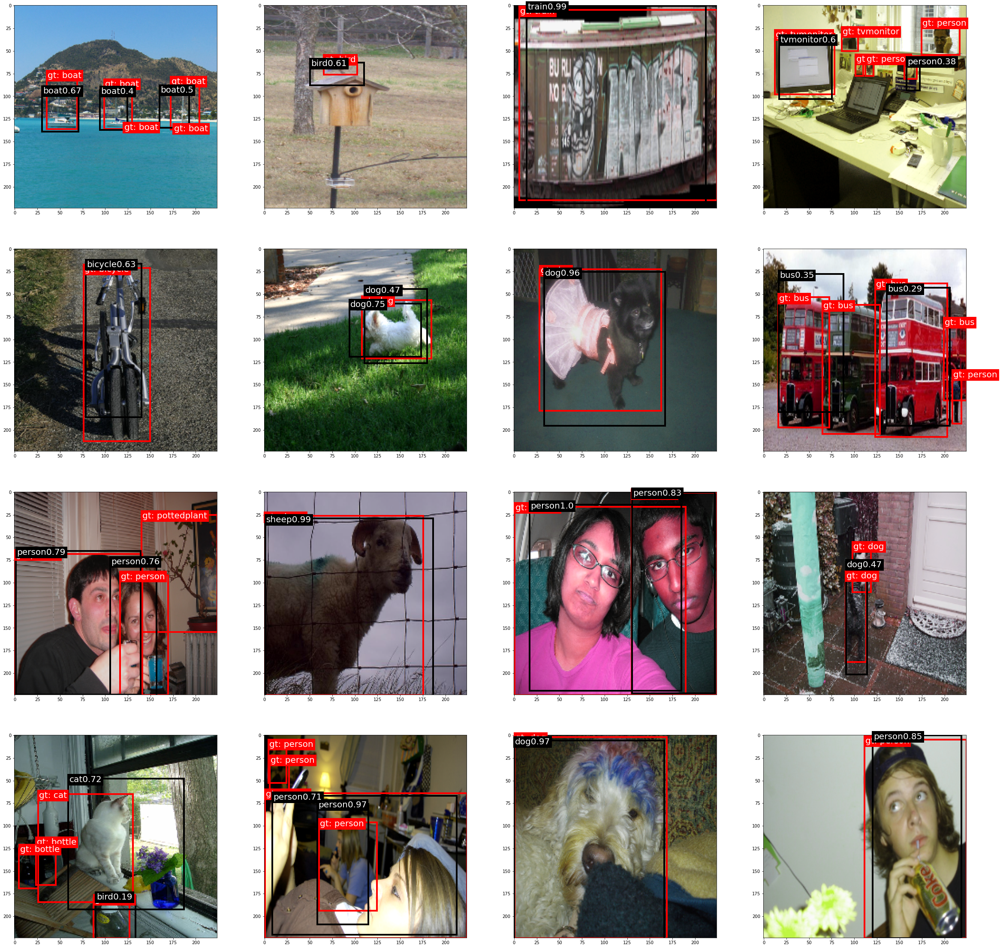

In [61]:
visualize_results(model, train_loader)

### Visualize Validation Data
The model works reasonably, well on images with few, not-overlapping objects but struggles to detect more challenging-to-detect objects, i.e. when there is a overlap, multiple objects in one image or bad lightning. As the model does much better on the training set it seems to not generalize well. This might be due to the limited capacity of the ResNet34 backbone.

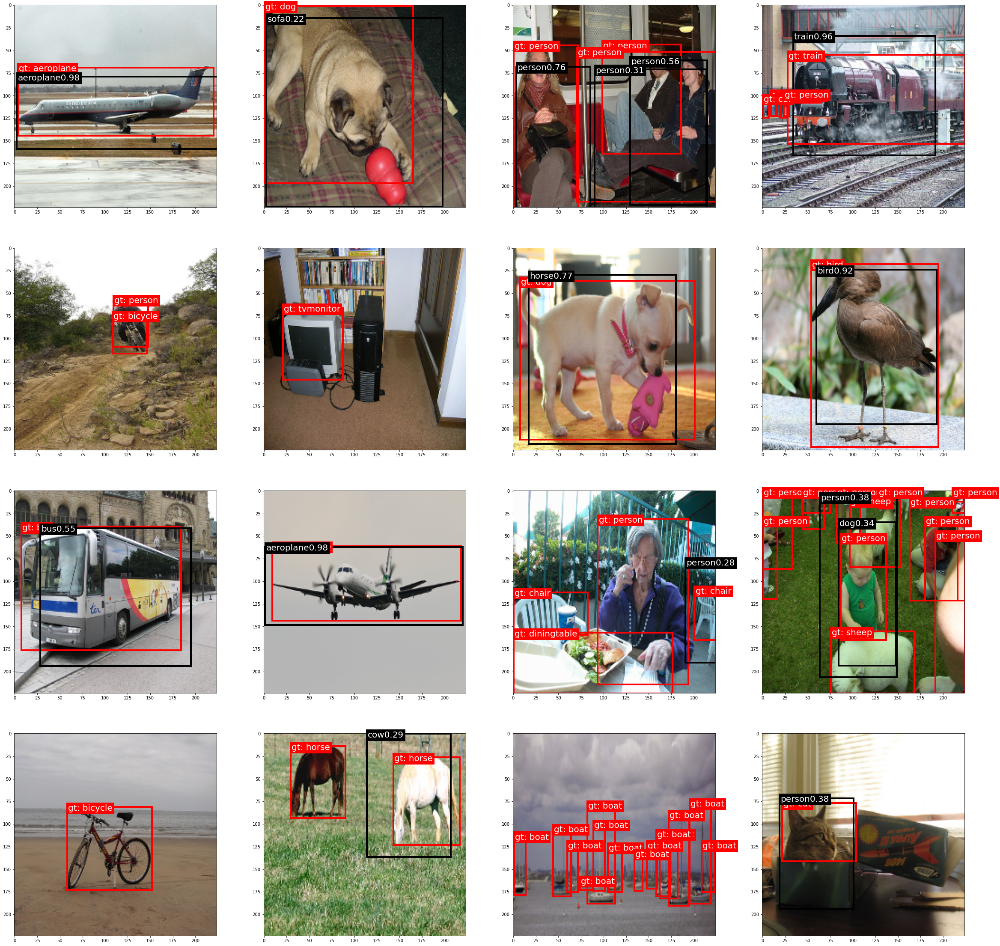

In [62]:
visualize_results(model, val_loader)